## Install the Required Packages¶

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import mean_squared_error
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from sklearn.tree import DecisionTreeRegressor

from sklearn.metrics import mean_absolute_error
from datetime import datetime
from sklearn.tree import export_graphviz
import graphviz
from sklearn.tree import plot_tree
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import explained_variance_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LogisticRegression

In [2]:
!pip install xgboost



In [3]:
 import xgboost as xgb

# 

## GATHERING THE DATA

In [4]:
df = pd.read_csv('PJME_hourly.csv')
df = df.set_index('Datetime')
df.index = pd.to_datetime(df.index)

In [5]:
df.head(10)

,PJME_MW
Datetime,
2002-12-31 01:00:00,26498.0
2002-12-31 02:00:00,25147.0
2002-12-31 03:00:00,24574.0
2002-12-31 04:00:00,24393.0
2002-12-31 05:00:00,24860.0
2002-12-31 06:00:00,26222.0
2002-12-31 07:00:00,28702.0
2002-12-31 08:00:00,30698.0
2002-12-31 09:00:00,31800.0


# 

# Describing our data

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145366 entries, 2002-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   PJME_MW  145366 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


# 

# Exploring our data

In [7]:
df.describe(include='all')

,PJME_MW
count,145366.000000
mean,32080.222831
std,6464.012166
min,14544.000000
25%,27573.000000
50%,31421.000000
75%,35650.000000
max,62009.000000


In [8]:
df["PJME_MW"].value_counts()

30051.0    24
32719.0    22
29798.0    22
28095.0    21
32244.0    21
           ..
51354.0     1
50542.0     1
49340.0     1
47574.0     1
40164.0     1
Name: PJME_MW, Length: 28441, dtype: int64

In [9]:
df["PJME_MW"].mean()

32080.222830648156

In [10]:
df["PJME_MW"].max()

62009.0

In [11]:
df["PJME_MW"].min()

14544.0

In [12]:
# Calculate the percentage increase or decrease for each value in the energy consumption
for i in range(1, len(df)):
    initial_consumption = df.iloc[i - 1, df.columns.get_loc('PJME_MW')]
    final_consumption = df.iloc[i, df.columns.get_loc('PJME_MW')]
    consumption_diff = final_consumption - initial_consumption
    consumption_change_pct = (consumption_diff / initial_consumption) * 100

    if consumption_change_pct > 0:
        print(f"The consumption value increased by {consumption_change_pct:.2f}% from {initial_consumption} to {final_consumption}.")
    elif consumption_change_pct < 0:
        print(f"The consumption value decreased by {consumption_change_pct:.2f}% from {initial_consumption} to {final_consumption}.")
    else:
        print(f"The house consumption stayed the same from {initial_consumption} to {final_consumption}.")

The consumption value decreased by -5.10% from 26498.0 to 25147.0.
The consumption value decreased by -2.28% from 25147.0 to 24574.0.
The consumption value decreased by -0.74% from 24574.0 to 24393.0.
The consumption value increased by 1.91% from 24393.0 to 24860.0.
The consumption value increased by 5.48% from 24860.0 to 26222.0.
The consumption value increased by 9.46% from 26222.0 to 28702.0.
The consumption value increased by 6.95% from 28702.0 to 30698.0.
The consumption value increased by 3.59% from 30698.0 to 31800.0.
The consumption value increased by 1.76% from 31800.0 to 32359.0.
The consumption value increased by 0.04% from 32359.0 to 32371.0.
The consumption value decreased by -1.45% from 32371.0 to 31902.0.
The consumption value decreased by -2.43% from 31902.0 to 31126.0.
The consumption value decreased by -2.44% from 31126.0 to 30368.0.
The consumption value decreased by -2.65% from 30368.0 to 29564.0.
The consumption value decreased by -1.58% from 29564.0 to 29098.0.
Th

In [13]:
# Calculate the percentage increase or decrease for each consecutive value in the house prices column
consumption_change_pct_list = []
for i in range(1, len(df)):
    initial_consumption = df.iloc[i-1, df.columns.get_loc ('PJME_MW')]
    final_consumption = df.iloc[i, df.columns.get_loc ('PJME_MW')]
    consumption_diff = final_consumption - initial_consumption
    consumption_change_pct = consumption_diff / initial_consumption * 100
    consumption_change_pct_list.append(consumption_change_pct)

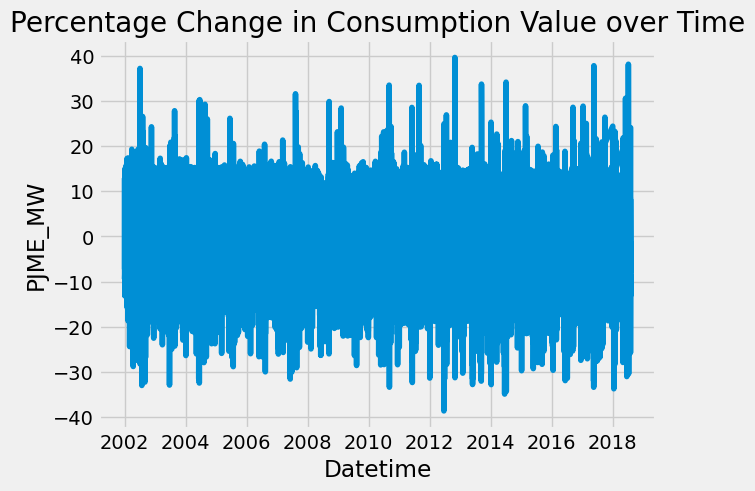

In [14]:
# Plot the results as a time series graph

import matplotlib.pyplot as plt
plt.close('all')



fig, ax = plt.subplots()
plt.plot(df.index[1:], consumption_change_pct_list)
plt.xlabel('Datetime')
plt.ylabel('PJME_MW')
plt.title('Percentage Change in Consumption Value over Time')
plt.show()

# 

# CREATING A COPY OF OUR DATAFRAME

In [15]:
df1 = df.copy()

In [16]:
df1

,PJME_MW
Datetime,
2002-12-31 01:00:00,26498.0
2002-12-31 02:00:00,25147.0
2002-12-31 03:00:00,24574.0
2002-12-31 04:00:00,24393.0
2002-12-31 05:00:00,24860.0
...,...
2018-01-01 20:00:00,44284.0
2018-01-01 21:00:00,43751.0
2018-01-01 22:00:00,42402.0


In [17]:
df1.columns

Index(['PJME_MW'], dtype='object')

In [18]:
df1

,PJME_MW
Datetime,
2002-12-31 01:00:00,26498.0
2002-12-31 02:00:00,25147.0
2002-12-31 03:00:00,24574.0
2002-12-31 04:00:00,24393.0
2002-12-31 05:00:00,24860.0
...,...
2018-01-01 20:00:00,44284.0
2018-01-01 21:00:00,43751.0
2018-01-01 22:00:00,42402.0


In [19]:
# Reset the index and create a new index column
df1.reset_index(inplace=True)

In [20]:
df1

,Datetime,PJME_MW
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0
...,...,...
145361,2018-01-01 20:00:00,44284.0
145362,2018-01-01 21:00:00,43751.0
145363,2018-01-01 22:00:00,42402.0
145364,2018-01-01 23:00:00,40164.0


In [21]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  145366 non-null  datetime64[ns]
 1   PJME_MW   145366 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 2.2 MB


In [22]:
# ADDING A NEW COLUMN DAYS OF THE WEEKS IN THE DATAFRAME 
data = df1
df2 = pd.DataFrame(data)

# Extract the day of the week
df2['Day_of_Week'] = df2['Datetime'].dt.dayofweek

# Display the DataFrame with the added 'day_of_week' column
print(df2)

                  Datetime  PJME_MW  Day_of_Week
0      2002-12-31 01:00:00  26498.0            1
1      2002-12-31 02:00:00  25147.0            1
2      2002-12-31 03:00:00  24574.0            1
3      2002-12-31 04:00:00  24393.0            1
4      2002-12-31 05:00:00  24860.0            1
...                    ...      ...          ...
145361 2018-01-01 20:00:00  44284.0            0
145362 2018-01-01 21:00:00  43751.0            0
145363 2018-01-01 22:00:00  42402.0            0
145364 2018-01-01 23:00:00  40164.0            0
145365 2018-01-02 00:00:00  38608.0            1

[145366 rows x 3 columns]


In [23]:
# Extract the year, month and time consumption columns and create new columns
df2['Year'] = df2['Datetime'].dt.year
df2['Month'] = df2['Datetime'].dt.month
df2['Consumption_Time'] = df2['Datetime'].dt.time


# Display the DataFrame with the added 'Year' and 'Month' columns
print(df2)

                  Datetime  PJME_MW  Day_of_Week  Year  Month Consumption_Time
0      2002-12-31 01:00:00  26498.0            1  2002     12         01:00:00
1      2002-12-31 02:00:00  25147.0            1  2002     12         02:00:00
2      2002-12-31 03:00:00  24574.0            1  2002     12         03:00:00
3      2002-12-31 04:00:00  24393.0            1  2002     12         04:00:00
4      2002-12-31 05:00:00  24860.0            1  2002     12         05:00:00
...                    ...      ...          ...   ...    ...              ...
145361 2018-01-01 20:00:00  44284.0            0  2018      1         20:00:00
145362 2018-01-01 21:00:00  43751.0            0  2018      1         21:00:00
145363 2018-01-01 22:00:00  42402.0            0  2018      1         22:00:00
145364 2018-01-01 23:00:00  40164.0            0  2018      1         23:00:00
145365 2018-01-02 00:00:00  38608.0            1  2018      1         00:00:00

[145366 rows x 6 columns]


In [24]:
# Rename the 'PJME_MW' column to 'Energy_Consumption'
df2 = df2.rename(columns={'PJME_MW': 'Energy_Consumption'})

In [25]:
df2

,Datetime,Energy_Consumption,Day_of_Week,Year,Month,Consumption_Time
0,2002-12-31 01:00:00,26498.0,1,2002,12,01:00:00
1,2002-12-31 02:00:00,25147.0,1,2002,12,02:00:00
2,2002-12-31 03:00:00,24574.0,1,2002,12,03:00:00
3,2002-12-31 04:00:00,24393.0,1,2002,12,04:00:00
4,2002-12-31 05:00:00,24860.0,1,2002,12,05:00:00
...,...,...,...,...,...,...
145361,2018-01-01 20:00:00,44284.0,0,2018,1,20:00:00
145362,2018-01-01 21:00:00,43751.0,0,2018,1,21:00:00
145363,2018-01-01 22:00:00,42402.0,0,2018,1,22:00:00
145364,2018-01-01 23:00:00,40164.0,0,2018,1,23:00:00


In [26]:


# Assuming df2 is your DataFrame with 'Month' and 'Day_of_Week' columns

# Dictionary with numeric keys corresponding to the months
month_dict = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}

# Replace values in the 'Month' column with month names using the dictionary
df2['Month'] = df2['Month'].map(month_dict)

# Dictionary with numeric keys corresponding to the weekdays
week_dict = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}

# Replace values in the 'Day_of_Week' column with weekday names using the dictionary
df2['Day_of_Week'] = df2['Day_of_Week'].map(week_dict)

# Define the proper order for months and weekdays
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Use Categorical data type to set the order
df2['Month'] = pd.Categorical(df2['Month'], categories=month_order, ordered=True)
df2['Day_of_Week'] = pd.Categorical(df2['Day_of_Week'], categories=weekday_order, ordered=True)

# Now, df2 is sorted in the proper order of months and weekdays


In [27]:

# Group by day of the week, year, month and time and calculate the mean energy consumption
avg_energy_by_day = df2.groupby('Day_of_Week')['Energy_Consumption'].mean() 


avg_energy_by_month = df2.groupby('Month')['Energy_Consumption'].mean()
# Reorder the month index based on the specified order
##avg_energy_by_month = avg_energy_by_month.reindex(avg_energy_by_month)

avg_energy_by_year = df2.groupby('Year')['Energy_Consumption'].mean()
avg_energy_by_consumption_time = df2.groupby('Consumption_Time')['Energy_Consumption'].mean() 

print(avg_energy_by_day)
print(avg_energy_by_month)
print(avg_energy_by_year)
print(avg_energy_by_consumption_time)




Day_of_Week
Monday       32672.028420
Tuesday      33272.265746
Wednesday    33261.497498
Thursday     33085.857727
Friday       32688.097688
Saturday     30162.880588
Sunday       29411.869930
Name: Energy_Consumption, dtype: float64
Month
January      34343.246462
February     33434.972049
March        30514.903609
April        27863.339354
May          28695.362113
June         33811.799183
July         37881.972881
August       36595.959675
September    31484.054688
October      28119.228675
November     29328.733872
December     32676.247669
Name: Energy_Consumption, dtype: float64
Year
2002    31565.617106
2003    31698.758621
2004    32270.434867
2005    33310.478648
2006    32409.269696
2007    33613.468600
2008    32929.593373
2009    31851.533683
2010    33101.172662
2011    32368.308518
2012    31440.107265
2013    31706.525120
2014    31496.406963
2015    31709.394178
2016    31337.833106
2017    30650.911644
2018    31782.598715
Name: Energy_Consumption, dtype: float64
Con

In [28]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Datetime            145366 non-null  datetime64[ns]
 1   Energy_Consumption  145366 non-null  float64       
 2   Day_of_Week         145366 non-null  category      
 3   Year                145366 non-null  int64         
 4   Month               145366 non-null  category      
 5   Consumption_Time    145366 non-null  object        
dtypes: category(2), datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 4.7+ MB


## HISTOGRAM CHART

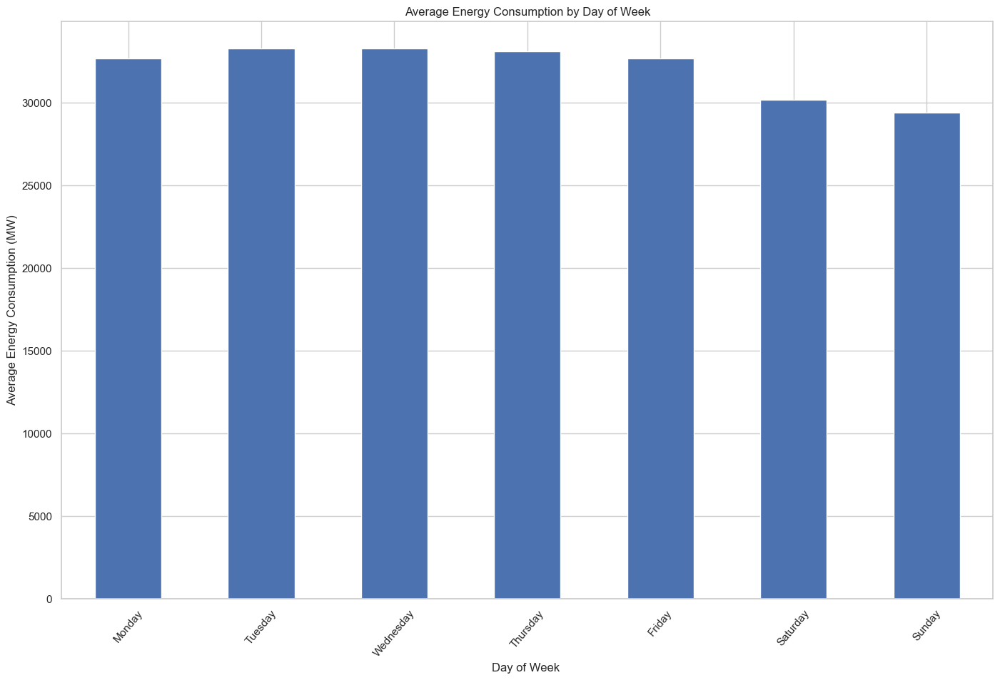

In [29]:

sns.set_theme(style="whitegrid")
# Plot the average energy consumption by day of the week
ax = avg_energy_by_day.plot(kind='bar', figsize=(15,10 ), title='Average Energy Consumption by Day of Week')
plt.xlabel('Day of Week ')
plt.ylabel('Average Energy Consumption (MW)')
plt.xticks(rotation = 50)
plt.show()


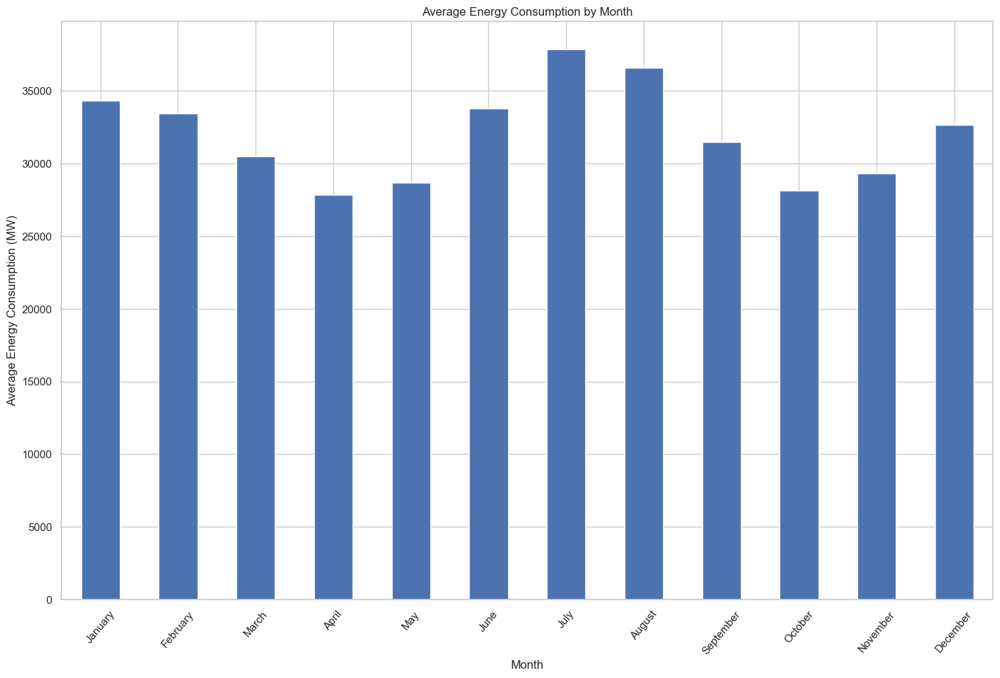

In [30]:
sns.set_theme(style="whitegrid")

# Plot the average energy consumption by day of the week
ax = avg_energy_by_month.plot(kind='bar', figsize=(15,10 ), title='Average Energy Consumption by Month')
plt.xlabel('Month')
plt.ylabel('Average Energy Consumption (MW)')
plt.xticks(rotation = 50)
plt.show()

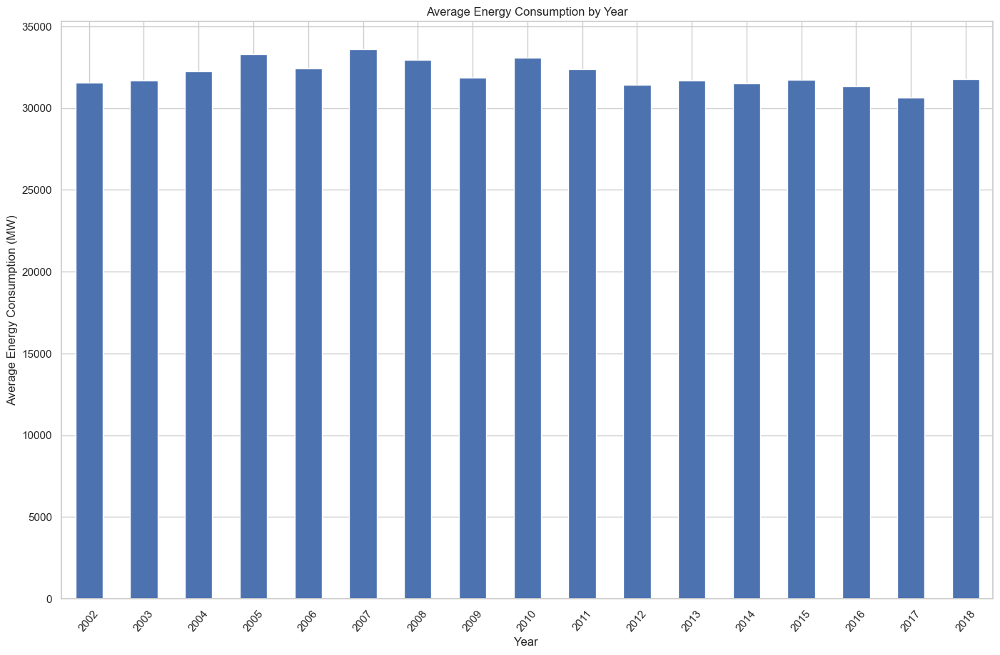

In [31]:
sns.set_theme(style="whitegrid")

# Plot the average energy consumption by day of the week
ax = avg_energy_by_year.plot(kind='bar', figsize=(15,10 ), title='Average Energy Consumption by Year')
plt.xlabel('Year ')
plt.ylabel('Average Energy Consumption (MW)')
plt.xticks(rotation = 50)
plt.show()


# 

# 

# PLOT LINE CHART

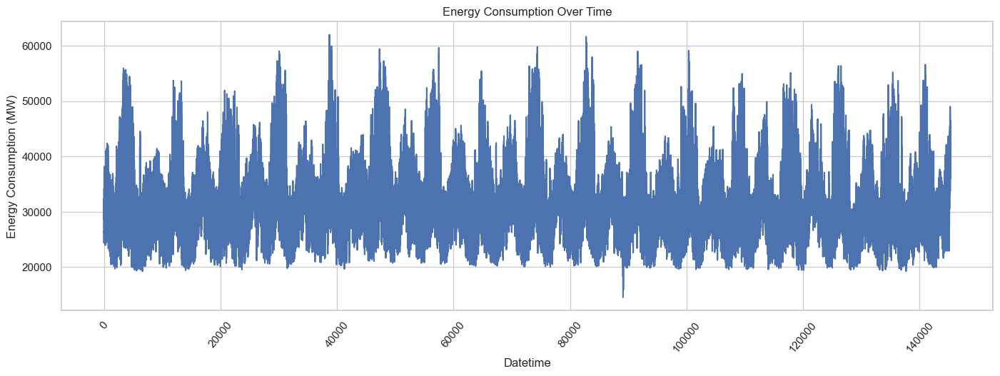

In [32]:

sns.set_theme(style="whitegrid")
# Plot the energy consumption over time
df2['Energy_Consumption'].plot(figsize=(15, 5), title='Energy Consumption Over Time')
plt.xlabel('Datetime')
plt.ylabel('Energy Consumption (MW)')
plt.xticks(rotation = 50)


plt.show()

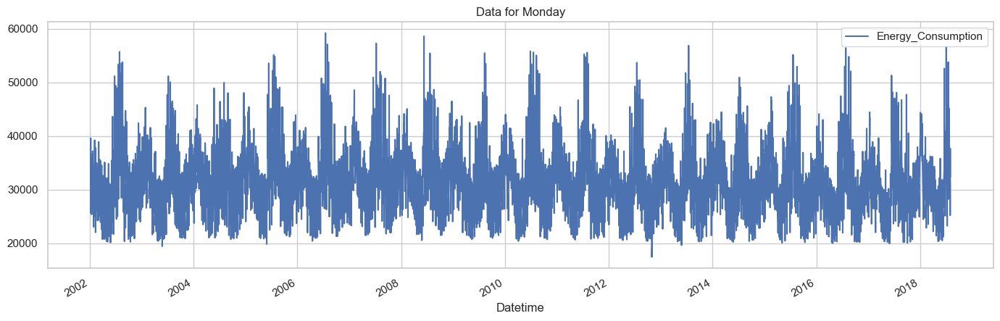

In [33]:
sns.set_theme(style="whitegrid")

# Example: Plotting data for a specific day of the week (e.g., Monday)
df2.loc[df2['Day_of_Week'] == "Monday"].plot(x='Datetime', y='Energy_Consumption', figsize=(15, 5), title='Data for Monday')
plt.show()

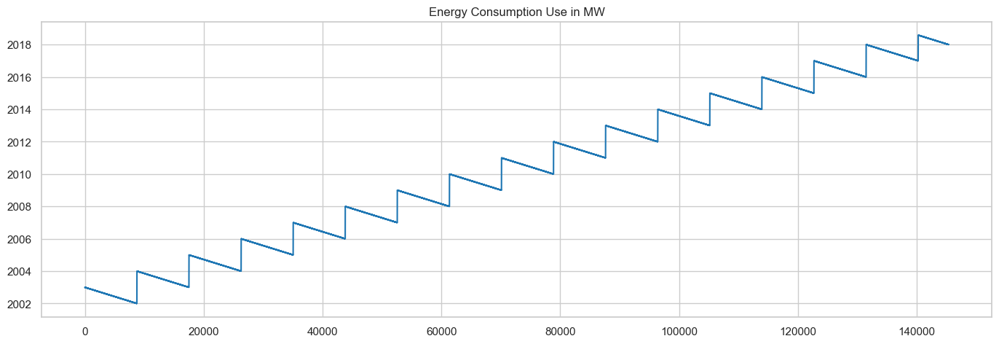

In [34]:
sns.set_theme(style="whitegrid")

df2['Datetime'].plot(x='Datetime', y='Energy_Consumption',
        figsize=(15, 5),
        color=color_pal[0],
        title= 'Energy Consumption Use in MW')
plt.show()

Text(0, 0.5, 'Energy Consumption (MW)')

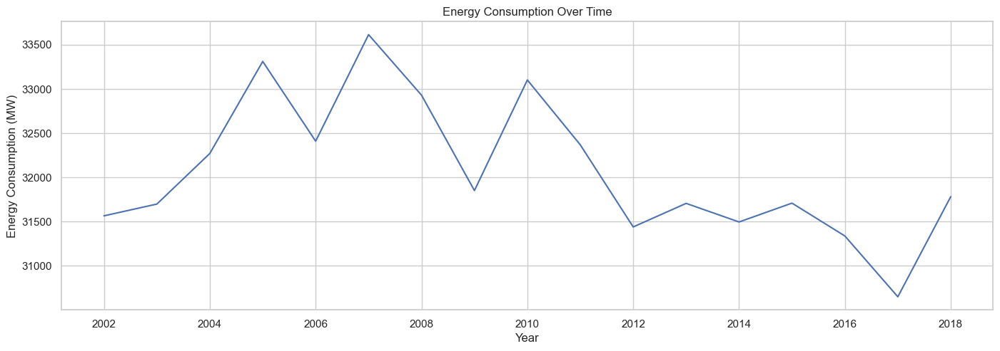

In [35]:
# Plot the energy consumption over time


ax = avg_energy_by_year.plot(kind='line', figsize=(15, 5), title='Energy Consumption Over Time')
ax.set_xlabel('Year')
ax.set_ylabel('Energy Consumption (MW)')


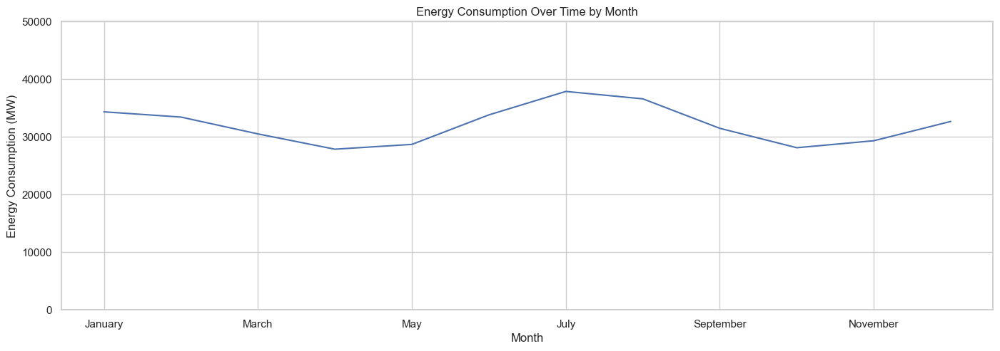

In [36]:
# Plot the energy consumption over time

sns.set_theme(style="whitegrid")

ax = avg_energy_by_month.plot(kind='line', figsize=(15, 5), title='Energy Consumption Over Time by Month')
ax.set_xlabel('Month')
ax.set_ylabel('Energy Consumption (MW)')
ax.set_ylim([0,50000])
for i in ax.patches:
    ax.annotate(i.get_height(),
                (i.get_x() + i.get_width() /2, i.get_height()),
                ha= "center", va="baseline", fontsize=12,
                color="black", xytext=(0,1),
                textcoords="offset points")


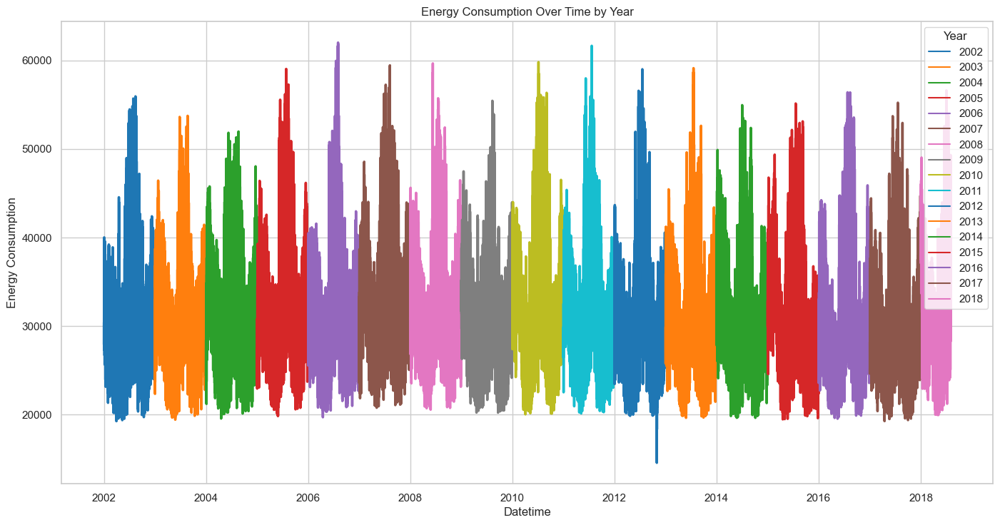

In [37]:
# Assuming df is your DataFrame
sns.set_theme(style="whitegrid")

# Plotting a lineplot using seaborn
plt.figure(figsize=(15, 8))
sns.lineplot(data=df2, x='Datetime', y='Energy_Consumption', hue='Year', palette="tab10", linewidth=2.5)

# Adjusting the plot appearance
plt.title('Energy Consumption Over Time by Year')
plt.xlabel('Datetime')
plt.ylabel('Energy Consumption')
plt.legend(title='Year', loc='upper right')

# Show the plot
plt.show()
             

# PLOT BOXPLOTS

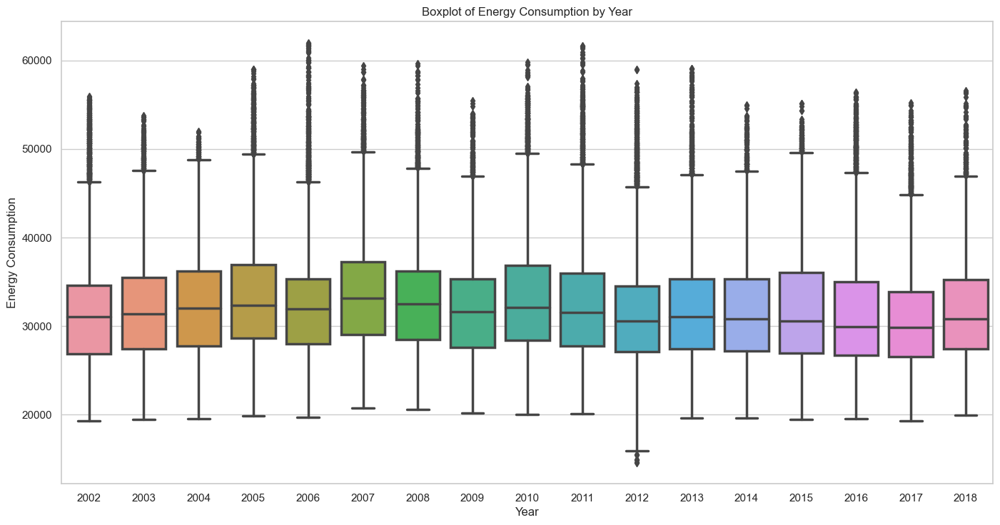

In [38]:
sns.set_theme(style="whitegrid")

# Assuming df2 is your DataFrame with columns 'Year' and 'Energy_Consumption'

# Create a figure and axis
fig, ax = plt.subplots(figsize=(15, 8))

# Use seaborn to create a boxplot
sns.boxplot(x='Year', y='Energy_Consumption', linewidth=2.5, data=df2)

# Set labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Energy Consumption')
ax.set_title('Boxplot of Energy Consumption by Year')

plt.show()


In [39]:
upper_limit = df2['Energy_Consumption'].mean() + 3*df2['Energy_Consumption'].std()
lower_limit = df2['Energy_Consumption'].mean() - 3*df2['Energy_Consumption'].std()
print('upper limit:', upper_limit)
print('lower limit:', lower_limit)

upper limit: 51472.25932988632
lower limit: 12688.186331409986


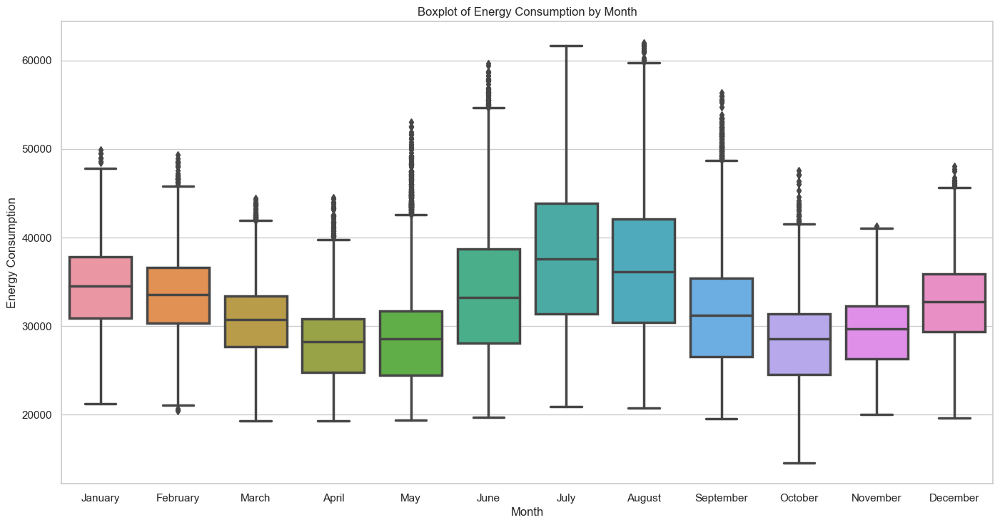

In [40]:
# Assuming df2 is your DataFrame with columns 'Year' and 'Energy_Consumption'

# Create a figure and axis
fig, ax = plt.subplots(figsize=(15, 8))

# Use seaborn to create a boxplot
sns.boxplot(x='Month', y='Energy_Consumption', linewidth=2.5, data=df2)

# Set labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Energy Consumption')
ax.set_title('Boxplot of Energy Consumption by Month')

plt.show()


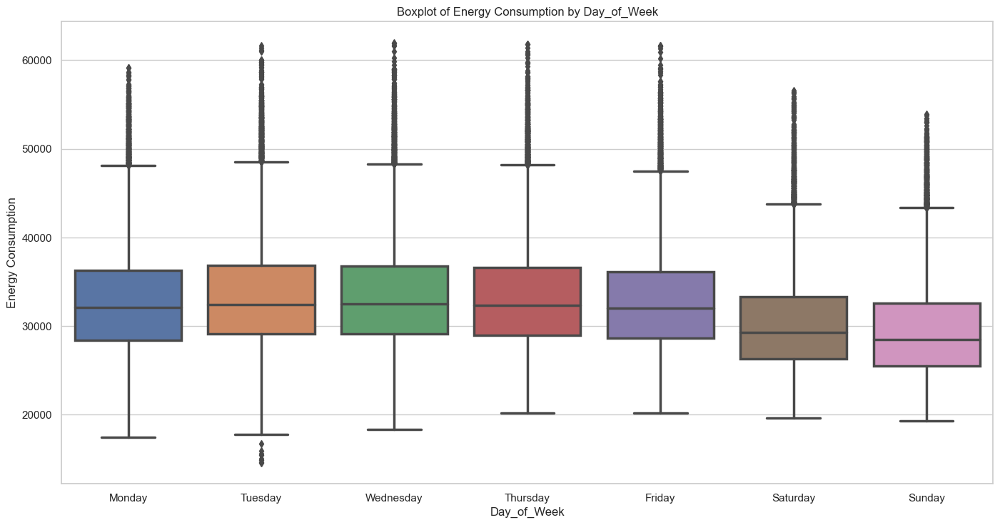

In [41]:
# Assuming df2 is your DataFrame with columns 'Year' and 'Energy_Consumption'

# Create a figure and axis
fig, ax = plt.subplots(figsize=(15, 8))

# Use seaborn to create a boxplot
sns.boxplot(x='Day_of_Week', y='Energy_Consumption', linewidth=2.5, data=df2)

# Set labels and title
ax.set_xlabel('Day_of_Week')
ax.set_ylabel('Energy Consumption')
ax.set_title('Boxplot of Energy Consumption by Day_of_Week')

plt.show()


# 

# Checking the Correlation between the variables

In [42]:
df2.head()

,Datetime,Energy_Consumption,Day_of_Week,Year,Month,Consumption_Time
0,2002-12-31 01:00:00,26498.0,Tuesday,2002,December,01:00:00
1,2002-12-31 02:00:00,25147.0,Tuesday,2002,December,02:00:00
2,2002-12-31 03:00:00,24574.0,Tuesday,2002,December,03:00:00
3,2002-12-31 04:00:00,24393.0,Tuesday,2002,December,04:00:00
4,2002-12-31 05:00:00,24860.0,Tuesday,2002,December,05:00:00


In [43]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Datetime            145366 non-null  datetime64[ns]
 1   Energy_Consumption  145366 non-null  float64       
 2   Day_of_Week         145366 non-null  category      
 3   Year                145366 non-null  int64         
 4   Month               145366 non-null  category      
 5   Consumption_Time    145366 non-null  object        
dtypes: category(2), datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 4.7+ MB


In [44]:
df2.dtypes

Datetime              datetime64[ns]
Energy_Consumption           float64
Day_of_Week                 category
Year                           int64
Month                       category
Consumption_Time              object
dtype: object

In [45]:
df2.corr()

,Energy_Consumption,Year
Energy_Consumption,1.000000,-0.058505
Year,-0.058505,1.000000


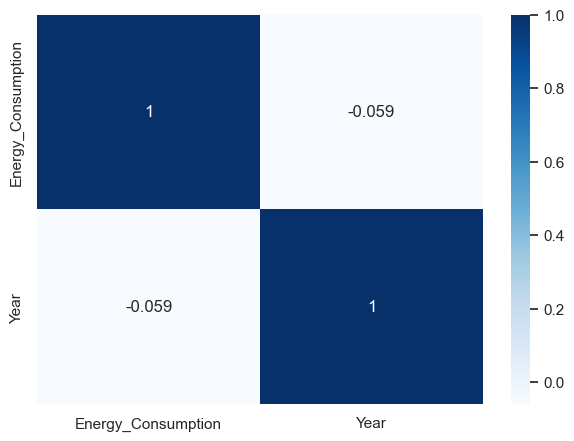

In [46]:
sns.heatmap(df2.corr(), cmap='Blues', annot=True);

# Data Quality

### Checking Nan values¶

In [47]:
df2.isnull().sum()

Datetime              0
Energy_Consumption    0
Day_of_Week           0
Year                  0
Month                 0
Consumption_Time      0
dtype: int64

In [48]:
df2.isnull().any()

Datetime              False
Energy_Consumption    False
Day_of_Week           False
Year                  False
Month                 False
Consumption_Time      False
dtype: bool

In [49]:
##Function to find out the percentage of null values in the dataframe

NullValues=df2.isnull().sum()/len(df2)
print(NullValues)

Datetime              0.0
Energy_Consumption    0.0
Day_of_Week           0.0
Year                  0.0
Month                 0.0
Consumption_Time      0.0
dtype: float64


### Checking for Duplicates Values

In [50]:
df2.duplicated().sum()

0

# 

# Preparing data for Machine Learning Model

## Data selection:

In [51]:
##Creating a new dataframe for our Machine Learning Model
df3 = pd.DataFrame(df2)

In [52]:
df3.head()

,Datetime,Energy_Consumption,Day_of_Week,Year,Month,Consumption_Time
0,2002-12-31 01:00:00,26498.0,Tuesday,2002,December,01:00:00
1,2002-12-31 02:00:00,25147.0,Tuesday,2002,December,02:00:00
2,2002-12-31 03:00:00,24574.0,Tuesday,2002,December,03:00:00
3,2002-12-31 04:00:00,24393.0,Tuesday,2002,December,04:00:00
4,2002-12-31 05:00:00,24860.0,Tuesday,2002,December,05:00:00


In [53]:
# Create new features for morning, afternoon, and evening
df3['morning'] = np.where((df3['Datetime'].dt.hour >= 6) & (df3['Datetime'].dt.hour < 12), 1, 0)
df3['afternoon'] = np.where((df3['Datetime'].dt.hour >= 12) & (df3['Datetime'].dt.hour < 18), 1, 0)
df3['evening'] = np.where((df3['Datetime'].dt.hour >= 18) & (df3['Datetime'].dt.hour < 24), 1, 0)

# Capture day of the week as cyclical feature using sine and cosine transformations
df3['day_of_week_sin'] = np.sin(2 * np.pi * df3['Datetime'].dt.dayofweek / 7)
df3['day_of_week_cos'] = np.cos(2 * np.pi * df3['Datetime'].dt.dayofweek / 7)

# Extract information about weekends
df3['weekend'] = np.where(df3['Datetime'].dt.dayofweek.isin([5, 6]), 1, 0)

# You can further customize these features based on your specific needs

# Display the modified DataFrame
print(df3.head())

             Datetime  Energy_Consumption Day_of_Week  Year     Month  \
0 2002-12-31 01:00:00             26498.0     Tuesday  2002  December   
1 2002-12-31 02:00:00             25147.0     Tuesday  2002  December   
2 2002-12-31 03:00:00             24574.0     Tuesday  2002  December   
3 2002-12-31 04:00:00             24393.0     Tuesday  2002  December   
4 2002-12-31 05:00:00             24860.0     Tuesday  2002  December   

  Consumption_Time  morning  afternoon  evening  day_of_week_sin  \
0         01:00:00        0          0        0         0.781831   
1         02:00:00        0          0        0         0.781831   
2         03:00:00        0          0        0         0.781831   
3         04:00:00        0          0        0         0.781831   
4         05:00:00        0          0        0         0.781831   

   day_of_week_cos  weekend  
0          0.62349        0  
1          0.62349        0  
2          0.62349        0  
3          0.62349        0  
4 

In [54]:
# Extract hour and minute information from 'Consumption_Time'
#df3['Hour'] = pd.to_datetime(df3['Datetime']).dt.hour
#df3['Minute'] = pd.to_datetime(df3['Datetime']).dt.minute

# Drop the origina DateTime column
#df3 = df3.drop('Datetime', axis=1)

# Drop the original 'Consumption_Time' column
#df3 = df3.drop('Consumption_Time', axis=1)

In [56]:
# Assuming your DataFrame is named 'df3'
# Create a mapping for seasons based on months
#season_mapping = {
    #'January': 'Winter',
   # 'February': 'Winter',
    #'March': 'Spring',
    #'April': 'Spring',
    #'May': 'Spring',
    #'June': 'Summer',
    #'July': 'Summer',
    #'August': 'Summer',
    #'September': 'Fall',
    #'October': 'Fall',
    #'November': 'Fall',
    #'#December': 'Winter'
#}

# Map the 'Month' column to create a new 'Season' column
#df3['Season'] = df3['Month'].map(season_mapping)

# Convert the 'Season' column to categorical
#df3['Season'] = df3['Season'].astype('category')

In [57]:
#df3.head()

,Energy_Consumption,Day_of_Week,Year,Month,morning,afternoon,evening,day_of_week_sin,day_of_week_cos,weekend,Hour,Minute,Season
0,26498.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,1,0,Winter
1,25147.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,2,0,Winter
2,24574.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,3,0,Winter
3,24393.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,4,0,Winter
4,24860.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,5,0,Winter


In [ ]:
# COVERTING BOTH MONTH AND DAY OF WEEK COLUMNS TO NUMERICAL DATA TYPE

# Define mapping dictionaries for Day_of_Week and Month
#day_of_week_mapping = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
#month_mapping = {'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6, 'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12}

# Replace values in the 'Day_of_Week' and 'Month' columns with numerical values
#df3['Day_of_Week'] = df3['Day_of_Week'].replace(day_of_week_mapping)
#df3['Month'] = df3['Month'].replace(month_mapping)



# Convert 'Day_of_Week' and 'Month' columns to numerical format
#df3['Day_of_Week'] = df3['Day_of_Week'].cat.codes + 1  # Adding 1 to avoid 0 as a category code
#df3['Month'] = df3['Month'].cat.codes + 1  # Adding 1 to avoid 0 as a category code



In [58]:
#df3.isnull().any()

Energy_Consumption    False
Day_of_Week           False
Year                  False
Month                 False
morning               False
afternoon             False
evening               False
day_of_week_sin       False
day_of_week_cos       False
weekend               False
Hour                  False
Minute                False
Season                False
dtype: bool

In [59]:
#df3.duplicated().sum()

39

In [60]:
#extracted_columns = df3.drop_duplicates()

In [61]:
#extracted_columns.duplicated().sum()

0

In [62]:
#extracted_columns.head()

,Energy_Consumption,Day_of_Week,Year,Month,morning,afternoon,evening,day_of_week_sin,day_of_week_cos,weekend,Hour,Minute,Season
0,26498.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,1,0,Winter
1,25147.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,2,0,Winter
2,24574.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,3,0,Winter
3,24393.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,4,0,Winter
4,24860.0,Tuesday,2002,December,0,0,0,0.781831,0.62349,0,5,0,Winter


In [63]:
#extracted_columns.dtypes

Energy_Consumption     float64
Day_of_Week           category
Year                     int64
Month                 category
morning                  int32
afternoon                int32
evening                  int32
day_of_week_sin        float64
day_of_week_cos        float64
weekend                  int32
Hour                     int64
Minute                   int64
Season                  object
dtype: object

## SAVE THE DATAFRAME TO A CSV FILE

In [64]:
#consumption_extracted_columns = pd.DataFrame(extracted_columns)

In [65]:
#consumption_extracted_columns.to_csv('energy_consumption_extracted_all_columns.csv', index=False)

## Encoding the dataset

In [ ]:
# Assume 'df' is your DataFrame with the 'Datetime' column
# Make sure 'Datetime' is in datetime format

# Create new features for morning, afternoon, and evening
df3['morning'] = np.where((df3['Datetime'].dt.hour >= 6) & (df3['Datetime'].dt.hour < 12), 1, 0)
df3['afternoon'] = np.where((df3['Datetime'].dt.hour >= 12) & (df3['Datetime'].dt.hour < 18), 1, 0)
df3['evening'] = np.where((df3['Datetime'].dt.hour >= 18) & (df3['Datetime'].dt.hour < 24), 1, 0)

# Capture day of the week as cyclical feature using sine and cosine transformations
df3['day_of_week_sin'] = np.sin(2 * np.pi * df3['Datetime'].dt.dayofweek / 7)
df3['day_of_week_cos'] = np.cos(2 * np.pi * df3['Datetime'].dt.dayofweek / 7)

# Extract information about weekends
df3['weekend'] = np.where(df3['Datetime'].dt.dayofweek.isin([5, 6]), 1, 0)

# You can further customize these features based on your specific needs

# Display the modified DataFrame
print(df3.head())

In [ ]:
# Extract hour and minute information from 'Consumption_Time'
df3['Hour'] = pd.to_datetime(df3['Datetime']).dt.hour
df3['Minute'] = pd.to_datetime(df3['Datetime']).dt.minute

# Drop the origina DateTime column
df3 = df3.drop('Datetime', axis=1)

# Drop the original 'Consumption_Time' column
df3 = df3.drop('Consumption_Time', axis=1)

In [ ]:
df3.head()

In [ ]:
# Display the correlation matrix
correlation_matrix = df3.corr()


print(correlation_matrix)


In [ ]:
df3

In [ ]:
df3.dtypes

In [ ]:
# Drop the original 'Minute' column as it does not have any usefulness for our machine learning analysis
df3.drop('Minute', axis=1, inplace=True)

In [ ]:
# Assuming your DataFrame is named 'df3'
# Create a mapping for seasons based on months
season_mapping = {
    1: 'Winter',
    2: 'Winter',
    3: 'Spring',
    4: 'Spring',
    5: 'Spring',
    6: 'Summer',
    7: 'Summer',
    8: 'Summer',
    9: 'Fall',
    10: 'Fall',
    11: 'Fall',
    12: 'Winter'
}



In [ ]:
# Map the 'Month' column to create a new 'Season' column
df3['Season'] = df3['Month'].map(season_mapping)

# Convert the 'Season' column to categorical
df3['Season'] = df3['Season'].astype('category')

# Use one-hot encoding to create binary columns for each season
df3 = pd.get_dummies(df3, columns=['Season'], drop_first=True)


In [ ]:
df3.head()

In [ ]:
# Extract hour and minute information from 'Consumption_Time'
#df3['Hour'] = pd.to_datetime(df3['Datetime']).dt.hour
#df3['Minute'] = pd.to_datetime(df3['Datetime']).dt.minute

# Drop the origina DateTime column
#df3 = df3.drop('Datetime', axis=1)

# Drop the original 'Consumption_Time' column
#df3 = X_final.drop('Consumption_Time', axis=1)

In [ ]:
# Convert categorical variables to numerical using one-hot encoding
#df3 = pd.get_dummies(df3, columns=['Month', 'Day_of_Week'], drop_first=True)

In [ ]:
df3.dtypes

In [ ]:
df3.info()

In [ ]:
df3.isnull().any()

In [ ]:
df3.isnull().sum()

In [ ]:
df3.duplicated().sum()

In [ ]:
df4 = df3.drop_duplicates()

In [ ]:
df4.duplicated().sum()

## CORRELATION MATRIX

In [ ]:
# Assuming df4 is your DataFrame
correlation_matrix = df4.corr()

# Extract correlations with respect to 'Energy_Consumption'
energy_correlations = correlation_matrix['Energy_Consumption'].sort_values(ascending=False)

# Display the correlations
print(energy_correlations)






In [ ]:
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(20, 15))
#sns.heatmap(df3, annot=True, fmt="d", linewidths=.5, ax=ax)


sns.heatmap(df4.corr(), cmap='Blues', annot=True);

In [ ]:
sns.regplot(x='Hour', y='Energy_Consumption', data=df4)

# 

# Preparing and parameter selection for the models

In [ ]:
df4.columns

In [ ]:
features = ['Hour']

In [ ]:
##Droping the Energy_Consumption column to be the target value in the machine learning model
## Creating an Y axis from the Energy_Consumption as it will be required later to be analysied in the Regression analysis

energy_consumption_scaled= pd.DataFrame(df4['Energy_Consumption'])

energy_consumption_scaled

In [ ]:
# Separating out the features
x_data = df4[features].values

x_data

In [ ]:
# Separating out the target
y_data = energy_consumption_scaled['Energy_Consumption'].values
print(y_data)

# 

# Model Paramenter Creation

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_data,y_data, test_size=0.3,random_state=0)
print('X_train:', X_train)
print('y_train:', y_train)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

# 

# Normalize and scale the dataset¶

In [ ]:
#Standard Scale the data for Linear Regression Model
# Create an object of StandardScaler class
scaler=StandardScaler()

#means apply standard scaler for X_train and X_test data
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

# 

# Model building¶¶

## Simple Linear Regression

In [ ]:
# Create an instance of the LinearRegression class
simple_linear_model = LinearRegression()

# Fit the model to the scaled training data
simple_linear_model.fit(X_train_scaled, y_train)

# Use the model to make predictions on the scaled test data
simple_prediction_model = simple_linear_model.predict(X_test_scaled)

In [ ]:
simple_prediction_model

# 

# Simple Linear Regression Evaluation Metrics¶

In [ ]:
slr_mse = mean_squared_error(y_test, simple_prediction_model)
slr_r2 = r2_score(y_test, simple_prediction_model)
slr_evs = explained_variance_score(y_test, simple_prediction_model)
slr_mae = mean_absolute_error(y_test, simple_prediction_model)
slr_rmse = np.sqrt(slr_mse)
slr_mape = np.mean(np.abs((y_test - simple_prediction_model) / y_test)) * 100

print("Simple Linear Regression MSE: {:.4f}".format(slr_mse))
print("Simple Linear Regression R-squared:", slr_r2)
print("Simple Linear Regression Explained Variance Score:", slr_evs)
print("Simple Linear Regression Mean Absolute Error:", slr_mae)
print(f"Simple Linear Regression Root Mean Squared Error: {slr_rmse}")
print(f"Simple Linear Regression Mean Absolute Percentage Error: {slr_mape}%")
# Calculate and display accuracy
accuracy=0
accuracy = 100 - np.mean(slr_mape)
print('Accuracy:', round(accuracy, 2), '%.')

## Apply Cross Validation to the Simple Linear Regression Model

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
k_folds = KFold(n_splits = 10)

scores = cross_val_score(simple_linear_model, X_train_scaled, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Standard Deviation CV Score: ", scores.std())
print("Number of CV Scores used in Average: ", len(scores))

## Visualise the Simple Linear Regression results

In [ ]:
import matplotlib.pyplot as plt
plt.close('all')

In [ ]:
plt.figure(figsize=(15,10))
plt.scatter(y_test, simple_prediction_model)
slope, intercept = np.polyfit(y_test, simple_prediction_model, 1)
plt.plot(simple_prediction_model, slope*simple_prediction_model + intercept, color='red')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()

In [ ]:
# Plot the predicted values against the true values for the test set
plt.scatter(y_test, simple_prediction_model)

# Add a trend line
p = np.polyfit(y_test, simple_prediction_model, 1)  # Fit a first-degree polynomial to the data
plt.plot(y_test, np.polyval(p, y_test), 'r')  # Plot the line

# Add a diagonal line for comparison
plt.plot([0, 50], [0, 50], '--', color='gray')

plt.xlabel('True values')
plt.ylabel('Predicted values')
# format the tick labels to display the full values
plt.ticklabel_format(useOffset=False)

plt.show()


In [ ]:
# set the float format to display 10 decimal places
pd.options.display.float_format = '{:.10f}'.format
pred_df=pd.DataFrame({'Actual Value':y_test,'Predicted Value':simple_prediction_model,'Difference':y_test-simple_prediction_model})
pred_df

# 

# Multiple Linear Regression

For the multiple linear regression model, I will be using all the columns for our features variables because they have strong correlation with the target column.

# 

In [ ]:
features1 = ['Day_of_Week', 'Year', 'Month', 'morning',
       'afternoon', 'evening', 'day_of_week_sin', 'day_of_week_cos', 'weekend',
       'Hour', 'Season_Spring', 'Season_Summer', 'Season_Winter']

In [ ]:
energy_consumption_scaled1 = pd.DataFrame(df4['Energy_Consumption'])

energy_consumption_scaled1

In [ ]:
# Separating out the features
x_data1 = df4[features1].values

x_data1

In [ ]:
# Separating out the target
y_data1 = energy_consumption_scaled1['Energy_Consumption'].values
print(y_data1)

## Split the dataset Train and test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_data1,y_data1, test_size=0.3,random_state=0)
print('X_train:', X_train)
print('y_train:', y_train)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

## Normalize and scale the dataset for the Linear Regression and Gradient Boosting Regression¶

In [ ]:
#Standard Scale the data for Linear Regression Model
# Create an object of StandardScaler class
scaler=StandardScaler()

#means apply standard scaler for X_train and X_test data
X_train_scaled1=scaler.fit_transform(X_train)
X_test_scaled1=scaler.transform(X_test)

# Model Building

### Multiple Linear Regression

In [ ]:
# Create an instance of the LinearRegression class
multiple_linear_model = LinearRegression()

# Fit the model to the scaled training data
multiple_linear_model.fit(X_train_scaled1, y_train)

# Use the model to make predictions on the scaled test data
multiple_prediction_model = multiple_linear_model.predict(X_test_scaled1)

In [ ]:
multiple_prediction_model

## Multiple Linear Regression Evaluation Metrics¶

In [ ]:
mlr_mse = mean_squared_error(y_test, multiple_prediction_model)
mlr_r2 = r2_score(y_test, multiple_prediction_model)
mlr_evs = explained_variance_score(y_test, multiple_prediction_model)
mlr_mae = mean_absolute_error(y_test, multiple_prediction_model)
mlr_rmse = np.sqrt(mlr_mse)
mlr_mape = np.mean(np.abs((y_test - multiple_prediction_model) / y_test)) * 100

print("Multiple Linear Regression MSE: {:.4f}".format(mlr_mse))
print("Multiple Linear Regression R-squared:", mlr_r2)
print("Multiple Linear Regression Explained Variance Score:", mlr_evs)
print("Multiple Linear Regression Mean Absolute Error:", mlr_mae)
print(f"Multiple Linear Regression Root Mean Squared Error: {mlr_rmse}")
print(f"Multiple Linear Regression Mean Absolute Percentage Error: {mlr_mape}%")
# Calculate and display accuracy
accuracy=0
accuracy = 100 - np.mean(mlr_mape)
print('Accuracy:', round(accuracy, 2), '%.')

### Apply Cross Validation to the Multiple Linear Regression Model

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
k_folds = KFold(n_splits = 10)

scores = cross_val_score(multiple_linear_model, X_train_scaled1, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Standard Deviation CV Score: ", scores.std())
print("Number of CV Scores used in Average: ", len(scores))

## Visualise the Multiple Linear regression results

In [ ]:
plt.figure(figsize=(15,10))
plt.scatter(y_test, multiple_prediction_model)
slope, intercept = np.polyfit(y_test, multiple_prediction_model, 1)
plt.plot(multiple_prediction_model, slope*multiple_prediction_model + intercept, color='red')
plt.xlabel('Actual')
plt.ylabel('Predictied')
plt.title('Actual vs Predicted')

plt.show()

In [ ]:
# set the float format to display 10 decimal places
pd.options.display.float_format = '{:.10f}'.format
multip_df=pd.DataFrame({'Actual Value':y_test,'Predicted Value':multiple_prediction_model,'Difference':y_test-multiple_prediction_model})
multip_df

# Decision Tree Regression Model

In [ ]:
features2 = ['Day_of_Week', 'Year', 'Month', 'morning',
       'afternoon', 'evening', 'day_of_week_sin', 'day_of_week_cos', 'weekend',
       'Hour', 'Season_Spring', 'Season_Summer', 'Season_Winter']

In [ ]:
energy_consumption_scaled2 = pd.DataFrame(df4['Energy_Consumption'])

energy_consumption_scaled2

In [ ]:
# Separating out the features
x_data2 = df4[features2].values

x_data2

In [ ]:
# Separating out the target
y_data2 = energy_consumption_scaled2['Energy_Consumption'].values
print(y_data2)

## Split the dataset Train and test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_data2,y_data2, test_size=0.3,random_state=0)
print('X_train:', X_train)
print('y_train:', y_train)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

In [ ]:
# Initialize the model and fit it to the training data
decision_tree_model = DecisionTreeRegressor(random_state=42)
decision_tree_model.fit(X_train, y_train)



In [ ]:
# Make predictions on the test set
decision_tree_predictions = decision_tree_model.predict(X_test)

In [ ]:
decision_tree_predictions

In [ ]:
dt_mse = mean_squared_error(y_test, decision_tree_predictions)
dt_r2 = r2_score(y_test, decision_tree_predictions)
dt_evs = explained_variance_score(y_test, decision_tree_predictions)
dt_mae = mean_absolute_error(y_test, decision_tree_predictions)
dt_rmse = np.sqrt(dt_mse)
dt_mape = np.mean(np.abs((y_test - decision_tree_predictions) / y_test)) * 100

print("Decision Tree Regression MSE:", dt_mse)
print("Decision Tree Regression R-squared:", dt_r2)
print("Decision Tree Regression Explained Variance Score:", dt_evs)
print("Decision Tree Regression Mean Absolute Error:", dt_mae)
print(f"Decision Tree Regression Root Mean Squared Error: {dt_rmse}")
print(f"Decision Tree Regression Mean Absolute Percentage Error: {dt_mape}%")
# Calculate and display accuracy
accuracy=0
accuracy = 100 - np.mean(dt_mape)
print('Accuracy:', round(accuracy, 2), '%.')

### Apply Cross Validation to the Decision Tree Regression Model

In [ ]:
k_folds = KFold(n_splits = 10)
scores = 0
scores = cross_val_score(decision_tree_model, X_train, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Standard Deviation CV Score: ", scores.std())
print("Number of CV Scores used in Average: ", len(scores))

In [ ]:
# set the float format to display 10 decimal places
pd.options.display.float_format = '{:.10f}'.format
dt_df=pd.DataFrame({'Actual Value':y_test,'Predicted Value':decision_tree_predictions,'Difference':y_test-decision_tree_predictions})
dt_df

### Visualise the decision tree regression results

In [ ]:
#plt.figure(figsize=(20,15))
#plot_tree(model, filled=True, feature_names=features1)
#plt.show()

# Build Gradient Boosting Regression Model

In [ ]:
features3 = ['Day_of_Week', 'Year', 'Month', 'morning',
       'afternoon', 'evening', 'day_of_week_sin', 'day_of_week_cos', 'weekend',
       'Hour', 'Season_Spring', 'Season_Summer', 'Season_Winter']

In [ ]:
energy_consumption_scaled3 = pd.DataFrame(df4['Energy_Consumption'])

energy_consumption_scaled3

In [ ]:
# Separating out the features
x_data3 = df4[features3].values

x_data3

In [ ]:
# Separating out the target
y_data3 = energy_consumption_scaled3['Energy_Consumption'].values
print(y_data3)

### Split dataset into training and testing sets¶

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_data3,y_data3, test_size=0.3,random_state=0)
print('X_train:', X_train)
print('y_train:', y_train)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

# 

In [ ]:
# Initialize the Gradient Boosting Regression model
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [ ]:
## Gradient Boosting Regression
gb_model = GradientBoostingRegressor()
gb_model.fit(X_train, y_train)
gb_prediction_model = gb_model.predict(X_test)
print(gb_prediction_model)

In [ ]:
gb_mse = mean_squared_error(y_test, gb_prediction_model)
gb_r2 = r2_score(y_test, gb_prediction_model)
gb_evs = explained_variance_score(y_test, gb_prediction_model)
gb_mae = mean_absolute_error(y_test, gb_prediction_model)
gb_rmse = np.sqrt(gb_mse)
gb_mape = np.mean(np.abs((y_test - gb_prediction_model) / y_test)) * 100
print("Gradient Boosting Regression MSE:", gb_mse)
print("Gradient Boosting Regression R-squared:", gb_r2)
print("Gradient Boosting Regression Explained Variance Score:", gb_evs)
print("Gradient Boosting Regression Mean Absolute Error:", gb_mae)
print(f"Gradient Boosting Regression Root Mean Squared Error: {gb_rmse}")
print(f"Gradient Boosting Regression Mean Absolute Percentage Error: {gb_mape}%")
# Calculate and display accuracy
accuracy=0
accuracy = 100 - np.mean(gb_mape)
print('Accuracy:', round(accuracy, 2), '%.')

### Apply Cross Validation to the Gradient Boosting Regression Model

In [ ]:
k_folds = KFold(n_splits = 10)
scores = 0
scores = cross_val_score(gb_model, X_train, y_train, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Standard Deviation CV Score: ", scores.std())
print("Number of CV Scores used in Average: ", len(scores))

In [ ]:
# Plot the predicted vs actual values for Gradient Boosting Regression Model
plt.scatter(y_test, gb_prediction_model)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Gradient Boosting Regression")
# Add a diagonal line with the same x and y values
min_val = min(np.min(y_test), np.min(gb_prediction_model))
max_val = max(np.max(y_test), np.max(gb_prediction_model))
plt.plot([min_val, max_val], [min_val, max_val], 'k--')

plt.show()

In [ ]:
plt.figure(figsize=(15,10))
plt.scatter(y_test, gb_prediction_model)
slope, intercept = np.polyfit(y_test, gb_prediction_model, 1)
plt.plot(gb_prediction_model, slope*gb_prediction_model + intercept, color='red')
plt.xlabel('Actual')
plt.ylabel('Predictied')
plt.title('Actual vs Predicted')

plt.show()

# Model evaluation using performance metrics¶

In [ ]:
# Create a dataframe to display the results
from tabulate import tabulate
results = 0
results = pd.DataFrame({
    'Model': ['Linear Regression', 'Multiple Linear Regression', 'Decision Tree Regression', 'Gradient Boosting Regression Model'],
    'MSE':       [slr_mse, mlr_mse, dt_mse, gb_mse],
    'R-squared': [slr_r2, mlr_r2, dt_r2, gb_r2],
    'EVS':       [slr_evs, mlr_evs, dt_evs, gb_evs],
    'MAE':       [slr_mae, mlr_mae, dt_mae, gb_mae],
    'RMSE':      [slr_rmse, mlr_rmse, dt_rmse, gb_rmse],
    'MAPE':      [slr_mape, mlr_mape, dt_mape, gb_mape]
})

print(tabulate(results, headers='keys', tablefmt='psql'))

# SAVING THE PREDICTIONS RESULTS TO A CSV FILE

In [ ]:
# Check lengths
lengths = [len(df4['Energy_Consumption'].values), len(simple_prediction_model), len(multiple_prediction_model), len(decision_tree_predictions), len(gb_prediction_model)]

# Print lengths
print("Lengths:", lengths)

In [ ]:
# Assuming df4 is your original DataFrame
actual_values = df4['Energy_Consumption'].values

# Assuming these are your predictions
simple_prediction_model = ...  # replace with your actual variable
multiple_prediction_model = ...  # replace with your actual variable
decision_tree_predictions = ...  # replace with your actual variable
gb_prediction_model = ...  # replace with your actual variable

# Create a common index
common_index = range(min(len(actual_values), len(simple_prediction_model), len(multiple_prediction_model), len(decision_tree_predictions), len(gb_prediction_model)))


# Create DataFrames for each model with the common index
df_predictions_simple_linear_regression = pd.DataFrame({'Actual': actual_values[common_index], 'Predicted_SLR': simple_prediction_model[common_index]})
df_predictions_multiple_linear_regression = pd.DataFrame({'Actual': actual_values[common_index], 'Predicted_MTL': multiple_prediction_model[common_index]})
df_predictions_decision_tree = pd.DataFrame({'Actual': actual_values[common_index], 'Predicted_DT': decision_tree_predictions[common_index]})
df_predictions_gradient_boosting = pd.DataFrame({'Actual': actual_values[common_index], 'Predicted_GB': gb_prediction_model[common_index]})


In [ ]:
# Assuming df_original is your original DataFrame
# Replace ... with actual variables
df_predictions_simple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_SLR': simple_prediction_model})
df_predictions_multiple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_MTL': multiple_prediction_model})
df_predictions_decision_tree = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_DT': decision_tree_predictions})
df_predictions_gradient_boosting = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_GB': gb_prediction_model})

# Display first few rows of each DataFrame
print("Simple Linear Regression:")
print(df_predictions_simple_linear_regression.head())

print("\nMultiple Linear Regression:")
print(df_predictions_multiple_linear_regression.head())

print("\nDecision Tree Regression:")
print(df_predictions_decision_tree.head())

print("\nGradient Boosting Regression:")
print(df_predictions_gradient_boosting.head())




In [ ]:
# Combine all predictions into one DataFrame
df_all_predictions = pd.concat([df_predictions_simple_linear_regression, df_predictions_multiple_linear_regression, df_predictions_decision_tree, df_predictions_gradient_boosting], axis=1)
print(df_all_predictions)

In [ ]:
import pandas as pd

# Assuming df4 is your original DataFrame
actual_values = df4['Energy_Consumption'].values



# Assuming these are your predictions
simple_prediction_model 
multiple_prediction_model 
decision_tree_predictions 
gb_prediction_model 




# Create DataFrames for each model
df_predictions_simple_linear_regression = pd.DataFrame({'Actual': actual_values, 'Predicted_SLR': simple_prediction_model})
df_predictions_multiple_linear_regression = pd.DataFrame({'Actual': actual_values, 'Predicted_MTL': multiple_prediction_model})
df_predictions_decision_tree = pd.DataFrame({'Actual': actual_values[:len(decision_tree_predictions)], 'Predicted_DT': decision_tree_predictions})
df_predictions_gradient_boosting = pd.DataFrame({'Actual': actual_values[:len(gb_prediction_model)], 'Predicted_GB': gb_prediction_model})


# Display first few rows of each DataFrame
print("Simple Linear Regression:")
print(df_predictions_simple_linear_regression.head())

print("\nMultiple Linear Regression:")
print(df_predictions_multiple_linear_regression.head())

print("\nDecision Tree Regression:")
print(df_predictions_decision_tree.head())

print("\nGradient Boosting Regression:")
print(df_predictions_gradient_boosting.head())


In [ ]:


# Assuming df_original is your original DataFrame
df_predictions_simple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_SLR': simple_prediction_model})
df_predictions_multiple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_MTL': multiple_prediction_model})

df_predictions_decision_tree = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_DT': decision_tree_predictions})
df_predictions_gradient_boosting = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_GB': gb_prediction_model})



# Display first few rows of each DataFrame
print("Simple Linear Regression:")
print(df_predictions_simple_linear_regression.head())

print("\nMultiple Linear Regression:")
print(df_predictions_multiple_linear_regression.head())

print("\nDecision Tree Regression:")
print(df_predictions_decision_tree.head())

print("\nGradient Boosting Regression:")
print(df_predictions_gradient_boosting.head())


In [ ]:
# Assuming df_original is your original DataFrame
# Replace ... with actual variables
df_predictions_simple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_SLR': simple_prediction_model.values})
df_predictions_multiple_linear_regression = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_MTL': multiple_prediction_model.values})
df_predictions_decision_tree = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_DT': decision_tree_predictions.values})
df_predictions_gradient_boosting = pd.DataFrame({'Actual': df4['Energy_Consumption'].values, 'Predicted_GB': gb_prediction_model.values})

# Display first few rows of each DataFrame
print("Simple Linear Regression:")
print(df_predictions_simple_linear_regression.head())

print("\nMultiple Linear Regression:")
print(df_predictions_multiple_linear_regression.head())

print("\nDecision Tree Regression:")
print(df_predictions_decision_tree.head())

print("\nGradient Boosting Regression:")
print(df_predictions_gradient_boosting.head())

# Combine all predictions into one DataFrame
df_all_predictions = pd.concat([df_predictions_simple_linear_regression, df_predictions_multiple_linear_regression, df_predictions_decision_tree, df_predictions_gradient_boosting], axis=1)
print(df_all_predictions)


## Concatenate DataFrames Horizontally:

In [ ]:
df_all_predictions = pd.concat([df_predictions_simple_linear_regression, df_predictions_multiple_linear_regression, df_predictions_decision_tree, df_predictions_gradient_boosting], axis=1)
print(df_all_predictions )

## Save Combined DataFrame to CSV

In [ ]:
df_all_predictions.to_csv('all_predictions_results.csv', index=False)

In [ ]:
df_all_columns = df4
print(df_all_columns)